### Cell type deconvolution analysis with cell2location - Exploratory analysis

Alpha testing run by Vitalii.

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import os,sys
import scanpy as sc
import squidpy as sq
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib
import seaborn as sns
import scipy.sparse
import anndata

In [3]:
figdir = "/home/jovyan/mount/gdrive/Pan_fetal/Updates_and_presentations/figures/spatial_mapping_EDA/"
if os.path.exists(figdir):
    sc.settings.figdir = figdir
else:
    os.mkdir(figdir)
    sc.settings.figdir = figdir
    

In [4]:
# ## Directory to save intermediate outputs
# writedir = "/nfs/team205/ed6/data/Fetal_immune/PAGA_FA_outs/"
# if not os.path.exists(writedir):
#     os.mkdir(writedir)    

In [5]:
import anndata2ri
import rpy2.rinterface_lib.callbacks
import logging

In [6]:
# Ignore R warning messages
#Note: this can be commented out to get more verbose R output
rpy2.rinterface_lib.callbacks.logger.setLevel(logging.ERROR)

Activate the anndata2ri conversion between SingleCellExperiment and AnnData

In [7]:
anndata2ri.activate()

In [8]:
%load_ext rpy2.ipython

In [9]:
%%R
library(tidyverse)

### Plotting utils

In [10]:
%%R
library(tidyverse)
library(reshape2)
library(patchwork)

remove_x_axis <- function(){
  theme(axis.text.x = element_blank(), axis.ticks.x = element_blank(), axis.title.x = element_blank())  
}

remove_y_axis <- function(){
  theme(axis.text.y = element_blank(), axis.ticks.y = element_blank(), axis.title.y = element_blank())  
}

In [11]:
def _spatial_plot_lib(adata_vis, lib, color_by=None, **kwargs):
    with matplotlib.rc_context({"axes.facecolor": "black"}):
        s_ind = adata_vis.obs['sample'] == lib
        s_keys = list(adata_vis.uns['spatial'].keys())
        s_spatial = np.array(s_keys)[[lib in i for i in s_keys]][0]
        adata_small = adata_vis[s_ind, :].copy()
        sc.pl.spatial(adata_small, library_id=s_spatial,
                                **kwargs)
        
def _plot_sorted_violin(merged_adata_bcells, groupby, y_value, return_list=False):
    n_cells_anno = merged_adata_bcells.obs[[groupby,y_value]].value_counts(groupby)
    keep_anno = n_cells_anno.index[n_cells_anno > 30]

    mean_sim = merged_adata_bcells.obs[[groupby,y_value]].groupby(groupby).mean()
    anno_order = mean_sim.loc[keep_anno].sort_values(y_value, ascending=False).index.tolist()

    merged_adata_bcells.var_names_make_unique()
    sc.pl.violin(merged_adata_bcells[merged_adata_bcells.obs[groupby].isin(keep_anno)], 
                                     y_value, groupby=groupby, rotation=90, 
                                     order=anno_order)
    if return_list:
        return(anno_order)
    

In [12]:
def select_slide(adata, s, s_col='sample'):
    r""" This function selects the data for one slide from the spatial anndata object.
    
    :param adata: Anndata object with multiple spatial experiments
    :param s: name of selected experiment
    :param s_col: column in adata.obs listing experiment name for each location
    """
    
    slide = adata[adata.obs[s_col].isin([s]), :].copy()
    s_keys = list(slide.uns['spatial'].keys())
    s_spatial = np.array(s_keys)[[s in k for k in s_keys]][0]

    slide.uns['spatial'] = {s_spatial: slide.uns['spatial'][s_spatial]}
    
    return slide

def plot_spatial_per_cell_type(adata, 
                                   cell_type='total_counts',
                                   samples=['WSSS_F_IMMsp9838712', 'WSSS_F_IMMsp9838717', 
                                             'WSSS_F_IMMsp9838710', 
                                             'WSSS_F_IMMsp9838715', 
                                            'WSSS_F_IMMsp9838711', 'WSSS_F_IMMsp9838716'],
                                  ncol=3, prefix=''):
        n_samples = len(samples)
        nrow = int(np.ceil(n_samples / ncol))
        fig, axs = plt.subplots(nrow, ncol, figsize=(18, 8))
        if nrow == 1:
            axs = axs.reshape((1, ncol))

        col_name = f'{prefix}{cell_type}'
        vmax = np.quantile(adata[adata.obs["sample"].isin(samples)].obs[col_name].values, 0.992)
        adata.obs[cell_type] = adata.obs[col_name].copy()

        from itertools import chain
        ind = list(chain(*[[(i, j) for i in range(nrow)] for j in range(ncol)]))

        for i, s in enumerate(samples):
            sp_data_s = select_slide(adata, s, s_col='sample')
            sc.pl.spatial(sp_data_s, cmap='magma',
                          color=cell_type, 
                          size=1.3, img_key='hires', alpha_img=1,
                          vmin=0, vmax=vmax, ax=axs[ind[i][0],ind[i][1]], show=False
                                                )
            axs[ind[i][0],ind[i][1]].title.set_text(cell_type+'\n'+s)

        fig.tight_layout(pad=0.5)

        return fig


In [13]:
def plot_w_ggplot(r_fct_str, args, figdir, pl_name='plot', pl_width=8, pl_height=8):

    import rpy2.robjects.pandas2ri
    import rpy2.robjects.numpy2ri
    from rpy2.robjects.packages import STAP

    r_pkg = STAP(r_fct_str, "r_pkg")
    
    # PASS OBJECTS INTO FUNCTION
    pl = r_pkg.plot_func(args)
    
    ggsave_str = '''
    save_plot <- function(pl, figdir, pl_name, pl_width, pl_height){
        pl + 
        ggsave(paste0(figdir, pl_name, ".png"), width=pl_width, height=pl_height)  +
        ggsave(paste0(figdir, pl_name, ".pdf"), width=pl_width, height=pl_height)
    }
    
    '''
    r_save = STAP(ggsave_str, "r_save")
    r_save.save_plot(pl, figdir, pl_name=pl_name, pl_width=pl_width, pl_height=pl_height)
    

### Read results

In [14]:
def read_c2l(c2l_outdir):
    adata_vis = sc.read_h5ad(c2l_outdir + "sp.h5ad")

    adata_vis.obs["Organ"] = adata_vis.obs["Organ"].str[0:2]

    ## Add total cell abundance
    adata_vis.obs['total_cell_abundance'] = adata_vis.uns['mod']['post_sample_means']['w_sf'].sum(1).flatten()

    # add 5% quantile, representing confident cell abundance, 'at least this amount is present', 
    # to adata.obs with nice names for plotting
    # adata_vis.obs[adata_vis.uns['mod']['factor_names']] = (adata_vis.obsm['q05_cell_abundance_w_sf'].T/adata_vis.obs["total_cell_abundance"]).T
    adata_vis.obs[adata_vis.uns['mod']['factor_names']] = adata_vis.obsm['q05_cell_abundance_w_sf'].copy()

    ## Make metadata table for libraries
    vis_sample_metadata = adata_vis.obs[["sample", 'Organ', "Age_PCW"]].drop_duplicates()
    vis_sample_metadata.index = vis_sample_metadata['sample'].copy()
    vis_sample_metadata = vis_sample_metadata.drop("sample", 1)

    ## Ref celltypes info
    celltypes_df = pd.DataFrame(adata_vis.uns['mod']['factor_names'], columns=['annotation'])
    celltypes_df['anno_group'] = [anno_groups_dict_rev[c] if c in anno_groups_dict_rev.keys() else "STROMAL" for c in celltypes_df.annotation]
    celltypes_df['stromal_organ'] = np.nan
    celltypes_df.loc[celltypes_df['anno_group'] == "STROMAL", "stromal_organ"] = [x[-1] for x in celltypes_df[celltypes_df['anno_group'] == "STROMAL"].annotation.str.split("_")]

    celltypes_df.index = celltypes_df['annotation'].copy()
    return(adata_vis, celltypes_df, vis_sample_metadata)

In [15]:
c2l_results_dir = '/nfs/team205/vk7/sanger_projects/collaborations/pan_fetal_immune_mapping/results/'

In [16]:
## Read annotation groupings
import json
with open('../../metadata/anno_groups.json', 'r') as json_file:
    anno_groups_dict = json.load(json_file)
anno_groups_dict_rev = {x:g for g,a in anno_groups_dict.items() for x in a}
anno_groups_dict_rev = {"_".join(k.split("/")):v for k,v in anno_groups_dict_rev.items()}

In [17]:
ids = ['SP', "LI_fetal_TECs", 'TH_fetal_TECs']
organs = ['SP', "LI", "TH"]
c2l_outdirs = [c2l_results_dir + 'spatial_mapping_{i}_tissuefilter_epochs50k_alphatest20/'.format(i=ids[i]) for i in range(len(ids))]

In [18]:
res_ls = [read_c2l(outdir) for outdir in c2l_outdirs]
    

In [19]:
c2l_results = {organs[i]:res_ls[i][0] for i in range(len(res_ls))}

In [20]:
vis_sample_metadata = pd.concat([res_ls[i][2] for i in range(len(res_ls))], ignore_index=True)
vis_sample_metadata.index = np.concatenate([res_ls[i][2].index.astype("str") for i in range(len(res_ls))])

In [21]:
vis_sample_metadata

,Organ,Age_PCW
WSSS_F_IMMsp9838709,SP,11
WSSS_F_IMMsp9838710,SP,18
WSSS_F_IMMsp9838714,SP,11
WSSS_F_IMMsp9838715,SP,18
WSSS_F_IMMsp10864181,SP,18
WSSS_F_IMMsp10864182,SP,18
WSSS_F_IMMsp9838712,LI,18
WSSS_F_IMMsp9838717,LI,18
WSSS_F_IMMsp10864184,LI,18
WSSS_F_IMMsp9838711,TH,18


... storing 'Organ' as categorical


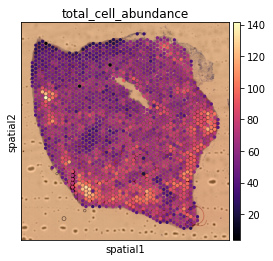

... storing 'Organ' as categorical


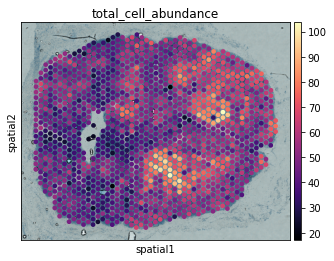

In [48]:
_spatial_plot_lib(c2l_results["SP"], lib=vis_sample_metadata.index[vis_sample_metadata.Organ=="SP"][3] , color=["total_cell_abundance"], size=1.3,
                 cmap='magma')
_spatial_plot_lib(c2l_results["TH"], lib=vis_sample_metadata.index[vis_sample_metadata.Organ=="TH"][2] , color=["total_cell_abundance"], size=1.3,
                 cmap='magma')

In [50]:
## Exclude 11PCW spleen for now
c2l_results['SP'] = c2l_results['SP'][c2l_results['SP'].obs["Age_PCW"] != '11'].copy()

In [ ]:
# ### Check cell types with lowest signal

# df = adata_vis.obsm['q05_cell_abundance_w_sf']
# detection_thresh = 2
# max_mean_abundance = df.max(0).sort_values() 
# undetected_cts = [x[-1] for x in max_mean_abundance.index[max_mean_abundance < detection_thresh].str.split('q05cell_abundance_w_sf_')]

# for ct in undetected_cts[0:5]:
#     plot_spatial_per_cell_type(adata_vis, cell_type=ct).show()

# Binarize detection is slides:

# slide_q05_abundance = adata_vis[adata_vis.obs['sample'] == s].obsm['q05_cell_abundance_w_sf']


# sns.set_context("talk")
# detection_thresh = 0.005
# for s in adata_vis.obs['sample'].unique():
#     slide_q05_abundance = adata_vis[adata_vis.obs['sample'] == s].obsm['q05_cell_abundance_w_sf']
#     q99 = pd.Series(np.quantile(slide_q05_abundance, 0.992, axis=0))
#     plt.plot(q99.sort_values()[0:80].values, '.',label=s + ' - '+ vis_sample_metadata.loc[s].Organ, );
#     plt.legend()
# plt.hlines(y= detection_thresh,xmin=0, xmax=80,color='r');
# plt.xlabel("celltype rank");
# plt.ylabel("max q05 abundance in slide");

# detected_ct_df = pd.DataFrame(index=adata_vis.obsm['q05_cell_abundance_w_sf'].columns.values)
# for s in adata_vis.obs['sample'].unique():
#     slide_q05_abundance = adata_vis[adata_vis.obs['sample'] == s].obsm['q05_cell_abundance_w_sf']
#     is_detected = pd.Series(np.quantile(slide_q05_abundance, 0.992, axis=0))
#     is_detected.index = detected_ct_df.index
#     is_detected[is_detected < detection_thresh] = 0
#     is_detected.name = s
#     detected_ct_df = pd.concat([detected_ct_df, is_detected], 1)

# detected_ct_df.index = [x[1] for x in detected_ct_df.index.str.split('q05cell_abundance_w_sf_')]
# detected_ct_df = detected_ct_df[adata_vis.obs['sample'].unique()]

# sns.set_context("paper")
# organs = vis_sample_metadata.loc[adata_vis.obs['sample'].unique()]["Organ"]
# lut = dict(zip(organs.unique(), "rbg"))
# organs_cols = organs.map(lut)
# sns.clustermap(np.log1p(detected_ct_df), cmap="magma", figsize=[10,20],
#                col_colors=organs_cols,
#                yticklabels=True )

### Check that abundance after deconvolution correlates with abundance in single-cell data

In [122]:
## Filter maternal contaminants
data_dir = '/nfs/team205/ed6/data/Fetal_immune/'
timestamp = '20210429'
mat_barcodes = pd.read_csv("~/Pan_fetal_immune/metadata/souporcell_results/maternal_barcodes.csv", index_col=0)
mat_barcodes["x"] = pd.Series([x.split("-1")[0] for x in mat_barcodes['x']])
anno_obs = pd.read_csv(data_dir + "PAN.A01.v01.entire_data_normalised_log.20210429.full_obs.annotated.clean.csv", index_col=0)

/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3146: DtypeWarning: Columns (6,21,22) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [123]:
## Abundance in sc data
sc_ct_counts = anno_obs[anno_obs.age > 16][anno_obs[anno_obs.age > 16].organ.isin(["TH", "LI", "SP"])].groupby(['organ','anno_lvl_2_final_clean']).count()
sc_ct_counts = sc_ct_counts.reset_index()[['organ','anno_lvl_2_final_clean','n_genes']]
sc_ct_counts.columns = ['organ','anno_lvl_2_final_clean','n_cells']

## Abundance in visium deconvolution
vis_ct_counts = adata_vis.obs[list(adata_vis.uns['mod']["factor_names"]) + ["Organ"]].groupby("Organ").sum()
vis_ct_counts = vis_ct_counts.reset_index().melt(id_vars=["Organ"], var_name="anno_lvl_2_final_clean", value_name="sum_cell_abundance")

vis_ct_counts.columns = ['organ'] + list(vis_ct_counts.columns[1:])

all_counts = pd.merge(vis_ct_counts, sc_ct_counts)
all_counts

,organ,anno_lvl_2_final_clean,sum_cell_abundance,n_cells
0,TH,ABT(ENTRY),19518.656939,982
1,LI,B1,2.030438,34
2,SP,B1,1606.641725,1019
3,TH,B1,966.809705,171
4,LI,BM_CD14_MONO,5.670914,30
...,...,...,...,...
155,SP,YS_ERY,784.805751,2
156,SP,YS_ERY_MACROPHAGE,81.513181,2
157,LI,pDC,5.556734,70
158,SP,pDC,31.636743,99


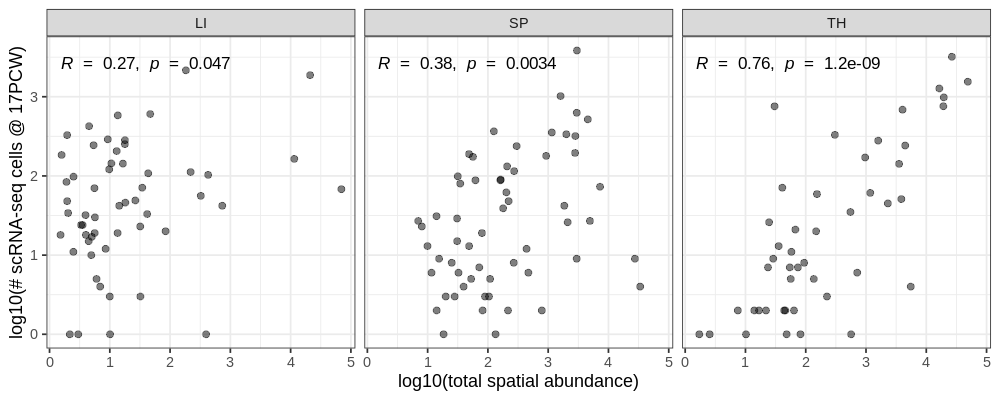

In [132]:
%%R -i all_counts -w 1000 -h 400 -i figdir
pl <- all_counts %>%
#     filter(mean_cell_abundance > 0.1) %>%
    ggplot(aes(log10(sum_cell_abundance), log10(n_cells))) +
    geom_point(size=3, alpha=0.5) +
    facet_wrap(organ~.) +
#     geom_smooth(method='lm') +
    ggpubr::stat_cor(size=6) +
    theme_bw(base_size = 18) +
    xlab("log10(total spatial abundance)") + ylab("log10(# scRNA-seq cells @ 17PCW)") 
    
ggsave(paste0(figdir, 'cell_abundance_comparison.pdf'),pl, width=10, height=4)
pl    

In [ ]:
# ## Viz detected cell types by slide

# def get_top_cts_per_slide(s, n_top=20):
#     small_adata = adata_cts[adata_cts.obs['sample'] == s].copy()
#     small_adata.var['max_abundance'] = small_adata.X.max(0)
#     sq.gr.spatial_neighbors(small_adata)

#     ## Top signal 
#     n_top = 20
#     top_signal_cts = detected_ct_df[s].sort_values(ascending=False)[0:n_top].index

#     ## Top spatially variable
#     detected_cts = detected_ct_df.index[detected_ct_df[s] > 0]
#     sq.gr.spatial_autocorr(
#         small_adata,
#         genes=detected_cts,
#         n_perms=100,
#         n_jobs=1,
#     )
#     top_var_cts = small_adata.uns["moranI"].head(n_top).index
#     return(top_signal_cts, top_var_cts, small_adata)

# ## Liver

# org = "LI"
# org_samples = vis_sample_metadata.index[vis_sample_metadata.Organ == org]

# for s in org_samples:
#     top_signal_cts, top_var_cts, small_adata = get_top_cts_per_slide(s)
#     _spatial_plot_lib(small_adata, lib = s, color=top_signal_cts,
#                      size=1.3, img_key='hires', alpha_img=1, vmin=0, vmax='p99.2')

# sns.set_context("talk")
# _spatial_plot_lib(small_adata, lib = s, color=top_signal_cts,
#                      size=1.3, img_key='hires', alpha_img=1, vmin=0, vmax='p99.2')

# _spatial_plot_lib(small_adata, lib = s, color=top_var_cts,
#                      size=1.3, img_key='hires', alpha_img=1, vmin=0, vmax='p99.2')

# s = org_samples[0]
# top_signal_cts, top_var_cts, small_adata = get_top_cts_per_slide(s)
# _spatial_plot_lib(small_adata, lib = s, color=top_signal_cts,
#                      size=1.3, img_key='hires', alpha_img=1, vmin=0, vmax='p99.2')

# _spatial_plot_lib(small_adata, lib = s, color=top_var_cts,
#                      size=1.3, img_key='hires', alpha_img=1, vmin=0, vmax='p99.2')

# keep_cts = detected_ct_df.index[detected_ct_df[org_samples].mean(1) > 0.01]

# ## Spleen

# org = "TH"
# org_samples = vis_sample_metadata.index[(vis_sample_metadata.Organ == org) & (vis_sample_metadata.Age_PCW == '18')]

# for s in org_samples:
#     top_signal_cts, top_var_cts, small_adata = get_top_cts_per_slide(s)
#     _spatial_plot_lib(small_adata, lib = s, color=top_signal_cts,
#                      size=1.3, img_key='hires', alpha_img=1, vmin=0, vmax='p99.2')
#     _spatial_plot_lib(small_adata, lib = s, color=top_var_cts,
#                      size=1.3, img_key='hires', alpha_img=1, vmin=0, vmax='p99.2')

# # _spatial_plot_lib(adata_vis, lib=org_samples[1], color=["CXCR4", "CCR9", "CCR4", "CCR7"], size=1.3, cmap='magma')
# _spatial_plot_lib(adata_vis, lib=org_samples[0], color=["DN(P)_T", "DN(Q)_T","ABT(ENTRY)", "CD4+T"], size=1.3)
# _spatial_plot_lib(adata_vis, lib=org_samples[0], color=["DP(P)_T", "DP(Q)_T","ABT(ENTRY)", "CD4+T"], size=1.3)
# _spatial_plot_lib(adata_vis, lib=org_samples[1], color=["NK_T", "NK", "TREG"], size=1.3)

# _spatial_plot_lib(adata_vis, lib=org_samples[1])

# ## Thymus

# org = "TH"
# org_samples = vis_sample_metadata.index[(vis_sample_metadata.Organ == org) & (vis_sample_metadata.Age_PCW == '18')]

# for s in org_samples:
#     top_signal_cts, top_var_cts, small_adata = get_top_cts_per_slide(s)
#     _spatial_plot_lib(small_adata, lib = s, color=top_signal_cts,
#                      size=1.3, img_key='hires', alpha_img=1, vmin=0, vmax='p99.2')
#     _spatial_plot_lib(small_adata, lib = s, color=top_var_cts,
#                      size=1.3, img_key='hires', alpha_img=1, vmin=0, vmax='p99.2')

### Read NMF results

In [22]:
def read_nmf(c2l_outdir, n_fact, out_type='ct_fractions'):
    nmf_outdir = c2l_outdir + 'CoLocatedComb/' + os.listdir(c2l_outdir + 'CoLocatedComb/')[0]
    if len(os.listdir(c2l_outdir + 'CoLocatedComb/')) > 1:
        nmf_outdir = c2l_outdir + 'CoLocatedComb/' + os.listdir(c2l_outdir + 'CoLocatedComb/')[1]
    if out_type == 'ct_fractions':
        ct_frac_outdir = nmf_outdir + "/cell_type_fractions_mean/"
        fact_mat = [x for x in os.listdir(ct_frac_outdir) if "n_fact" + str(n_fact) in x][0]
        out = pd.read_csv(ct_frac_outdir + fact_mat, index_col=0)
    elif out_type == "location":
        loc_outdir = nmf_outdir + "/location_factors_mean/"
        fact_mat = [x for x in os.listdir(loc_outdir) if "n_fact" + str(n_fact) in x][0]
        out = pd.read_csv(loc_outdir + fact_mat, index_col=0)
    return(out)

## Find celltypes where the max abundance in each slide is below a defined threshold
# (to exclude from co-location analysis)
def get_undetected_cts(adata_vis, vis_sample_metadata, detection_thresh = 0.15):
    detected_ct_df = pd.DataFrame(index=adata_vis.obsm['q05_cell_abundance_w_sf'].columns.values)
    for s in adata_vis.obs['sample'].unique():
        slide_q05_abundance = adata_vis[adata_vis.obs['sample'] == s].obsm['q05_cell_abundance_w_sf']
        is_detected = pd.Series(np.quantile(slide_q05_abundance, 0.992, axis=0))
        is_detected.index = detected_ct_df.index
        is_detected[is_detected < detection_thresh] = 0
        is_detected.name = s
        detected_ct_df = pd.concat([detected_ct_df, is_detected], 1)

    detected_ct_df.index = [x[1] for x in detected_ct_df.index.str.split('q05cell_abundance_w_sf_')]
    detected_ct_df = detected_ct_df[adata_vis.obs['sample'].unique()]

    undetected_cts = detected_ct_df[detected_ct_df.sum(1)==0].index
    return(undetected_cts)

def get_colocation_from_nmf(adata_vis, vis_sample_metadata, c2l_outdir, n_factors, min_frac = 0.2, detection_thresh=0.15):
    ## Read celltype fractions 
    nmf_fractions = read_nmf(c2l_outdir, n_fact=n_factors)
    ## Exclude undetected cts
    exclude_cts = get_undetected_cts(adata_vis, vis_sample_metadata, detection_thresh=detection_thresh)
    nmf_fractions = nmf_fractions[~nmf_fractions.index.isin(exclude_cts)]
    ## Filter by minimum fraction associated to factor 
    nmf_fractions = nmf_fractions.mask(nmf_fractions < min_frac, other=0)
    coloc_df = nmf_fractions.mask(nmf_fractions > 0, other=1)
    coloc_df.columns = ['fact_'+str(i) for i in range(n_factors)]
    return(coloc_df)

def pick_n_factors(c2l_outdir, n_fact_range=range(10,20)):
    max_cors = []
    for n in n_fact_range:
        nmf_fractions = read_nmf(c2l_outdir, n_fact=n)
        fact_cors = np.corrcoef(nmf_fractions.T)
        np.fill_diagonal(fact_cors, 0)
        max_cor = fact_cors.max()
        max_cors.append(max_cor)
    return(n_fact_range[np.argmin(max_cors)])

In [457]:
# ## Read full c2l output
# c2l_outdir = c2l_outdirs[1]
# adata_vis, celltypes_df, vis_sample_metadata = read_c2l(c2l_outdir)

# ## Pick n of factors for NMF
# n_factors = pick_n_factors(c2l_outdir)

# coloc_df = get_colocation_from_nmf(adata_vis, vis_sample_metadata, c2l_outdirs[1], n_factors=n_factors, min_frac = 0.15, detection_thresh=0.15)

# ## Micro grid search
# coloc_params = {
#     'min_frac':[0.05, 0.1, 0.15, 0.2, 0.25],
#     'n_factors':range(10,20)
#                }

# coloc_grid = pd.DataFrame(index=['n_factors', 'min_frac', 'min_cts', 'max_cts', "n_cts"])
# for n in coloc_params['n_factors']:
#     for f in coloc_params['min_frac']:
#         coloc_df = get_colocation_from_nmf(adata_vis, vis_sample_metadata, c2l_outdirs[1], n_factors=n, min_frac = f, detection_thresh=0.15)
#         coloc_df = coloc_df[coloc_df.sum(1) != 0]
#         max_n_cts = coloc_df.sum().max()
#         min_n_cts = coloc_df.sum().min()
#         n_cts = coloc_df.shape[0]
#         df = pd.DataFrame([n, f, min_n_cts, max_n_cts, n_cts], index=['n_factors', 'min_frac', 'min_cts', 'max_cts', 'n_cts'])
#         coloc_grid = pd.concat([coloc_grid, df], 1)

# coloc_grid_df = coloc_grid.T

# %%R -i coloc_grid_df
# library(patchwork)

# p1 <- ggplot(coloc_grid_df, aes(x=n_factors, y=min_frac, fill=max_cts/n_cts)) +
# geom_tile() +
# geom_text(aes(label=round(max_cts/n_cts, 1))) +
# scale_fill_distiller(palette="Reds", direction=-1) +
# theme_classic(base_size=18)

# p2 <- ggplot(coloc_grid_df, aes(x=n_factors, y=min_frac, fill=min_cts)) +
# geom_tile() +
# geom_text(aes(label=min_cts)) +
# scale_fill_distiller(palette="Reds", direction=-1) +
# theme_classic(base_size=18)

# p1 / p2

# ## Read full c2l output
# c2l_outdir = c2l_outdirs[0]
# adata_vis, celltypes_df, vis_sample_metadata = read_c2l(c2l_outdir)

# coloc_params = {
#     'min_frac':[0.05, 0.1, 0.15, 0.2, 0.25],
#     'n_factors':range(10,20)
#                }

# coloc_grid = pd.DataFrame(index=['n_factors', 'min_frac', 'min_cts', 'max_cts'])
# for n in coloc_params['n_factors']:
#     for f in coloc_params['min_frac']:
#         coloc_df = get_colocation_from_nmf(adata_vis, vis_sample_metadata, c2l_outdir, n_factors=n, min_frac = f, detection_thresh=0.15)
#         max_n_cts = coloc_df.sum().max()
#         min_n_cts = coloc_df.sum().min()
#         df = pd.DataFrame([n, f, min_n_cts, max_n_cts], index=['n_factors', 'min_frac', 'min_cts', 'max_cts'])
#         coloc_grid = pd.concat([coloc_grid, df], 1)

# coloc_grid_df = coloc_grid.T

# %%R -i coloc_grid_df
# library(patchwork)

# p1 <- ggplot(coloc_grid_df, aes(x=n_factors, y=min_frac, fill=max_cts)) +
# geom_tile() +
# geom_text(aes(label=max_cts)) +
# scale_fill_distiller(palette="Reds", direction=-1) +
# theme_classic(base_size=18)

# p2 <- ggplot(coloc_grid_df, aes(x=n_factors, y=min_frac, fill=min_cts)) +
# geom_tile() +
# geom_text(aes(label=min_cts)) +
# scale_fill_distiller(palette="Reds", direction=-1) +
# theme_classic(base_size=18)

# p1 / p2

# ## Pick max number of factors where we don't exclude any factor at min_frac=0.1
# pick_params_df = coloc_grid_df[(coloc_grid_df['min_cts'] >= 2) & (coloc_grid_df['min_frac'] == 0.15)].sort_values('n_factors')
# pick_params_df = pick_params_df[pick_params_df.n_factors.diff() == 1]
# pick_n_factors = pick_params_df[pick_params_df.n_factors == pick_params_df.n_factors.max()].n_factors.values[0]

In [23]:
min_frac = 0.2
c2l_outdirs_dict = dict(zip(organs, c2l_outdirs))
n_factors_dict = {k:pick_n_factors(c2l_outdirs_dict[k]) for k in c2l_outdirs_dict.keys()}

nmf_fractions_dict = {k:read_nmf(c2l_outdirs_dict[k], n_factors_dict[k]) for k in c2l_outdirs_dict.keys()}

## Read fraction values to locations
for o in organs:
    nmf_mat = read_nmf(c2l_outdirs_dict[o], n_fact=n_factors_dict[o], out_type='location')
    c2l_results[o].obsm["NMF"] = nmf_mat.loc[c2l_results[o].obs_names]
    c2l_results[o].obsm["NMF"].columns = [x[1] for x in c2l_results[o].obsm["NMF"].columns.str.split("mean_nUMI_factors")]
    c2l_results[o].obsm["NMF"] = c2l_results[o].obsm["NMF"].mask(c2l_results[o].obsm["NMF"] < min_frac, 0)
    if any([x in c2l_results[o].obs.columns for x in c2l_results[o].obsm["NMF"].columns]):
        c2l_results[o].obs = c2l_results[o].obs.drop(c2l_results[o].obsm["NMF"].columns, 1)
    c2l_results[o].obs = pd.concat([c2l_results[o].obs, c2l_results[o].obsm["NMF"]], 1)

### Plot factors and cell type fractions per organ

In [459]:
def plot_nmf_fractions_ct(pl_df, org_fs, outfile, hm_height=10, hm_width=12):
    r_fct_str = '''
    library(tidyverse)
    plot_nmf_fractions <- function(pl_df, org_fs, outfile, save=TRUE, pl_height=10, pl_width=12){
        p1 <- pl_df %>%
            rownames_to_column("cell_type") %>%
            pivot_longer(cols=- cell_type, names_to="factor", values_to="ct_fraction") %>%
            mutate(factor=str_remove(factor, "mean_cell_type_factors")) %>%
            group_by(cell_type) %>%
            mutate(top_fact = which.max(ct_fraction)) %>%
            ungroup() %>%
            arrange(top_fact) %>%
            mutate(cell_type=factor(cell_type, levels=unique(cell_type))) %>%
            filter(factor %in% org_fs) %>%
            mutate(factor = factor(str_replace(factor, "fact_", "Factor "), levels=str_replace(org_fs, "fact_", "Factor "))) %>%
            ggplot(aes(factor, cell_type, color=ct_fraction, size=ct_fraction)) +
            geom_point() +
            scale_color_viridis_c(option='magma', direction=-1, name="cell type\nfraction", guide = "legend") +
            scale_size(name="cell type\nfraction") +
            ylab("cell type") +
            theme_bw(base_size=14) +
            theme(axis.text.x=element_text(angle=45, hjust=1, vjust=1)
                 )
        if (isTRUE(save)){
            print(paste0('saving to ', outfile))
            ggsave(paste0(outfile, '.pdf'), p1, height=pl_height, width=pl_width)
            ggsave(paste0(outfile, '.png'), p1, height=pl_height, width=pl_width)
          } else {
           print("not saving")
          p1   
        }
    }
    '''

    import rpy2.robjects.pandas2ri
    import rpy2.robjects.numpy2ri
    from rpy2.robjects.packages import STAP

    r_pkg = STAP(r_fct_str, "r_pkg")
    # PASS OBJECTS INTO FUNCTION
    r_pkg.plot_nmf_fractions(pl_df, org_fs, outfile, pl_height = hm_height, pl_width = hm_width)

def plot_nmf_spatial(adata_vis, org_fs, lib, outfile, ncols=2):
    ## Save spatial plots 
    sns.set_context("talk")
    plt.rcParams["figure.figsize"] = [10,10]
    plt.rcParams['axes.titlesize'] = 32
    plt_titles = [None] + ["Factor " + x.split("_")[1] for x in org_fs.values]
    _spatial_plot_lib(adata_vis, color=[None] + list(org_fs.values), lib=lib, ncols=ncols, size=1.3, 
                      save=outfile, frameon=False,
                      title=plt_titles, show=False
                     )
    plt.rcParams['axes.titlesize'] = 20


def get_nmf_frac_4_plotting(nmf_fractions, org, org_fs, min_prop=0.25):
    all_orgs = ["SP", "LI", "TH"]
    ## Filter cell types by minimum proportion assigned to fraction
    filt_nmf_fractions = nmf_fractions[nmf_fractions[['mean_cell_type_factors' + x for x in org_fs]].max(1) > min_prop]
    pl_df = filt_nmf_fractions[['mean_cell_type_factors' + x for x in org_fs]]

    ## Exclude low Q annotations
    pl_df = pl_df[~pl_df.index.isin(anno_groups_dict["OTHER"])]

    ## Exclude stromal cells from other organs
    all_orgs.remove(org)
    end1, end2 = ("_" + x for x in all_orgs)
    remove_stromal = [x for x in pl_df.index if x.endswith(end1) or x.endswith(end2)]
    pl_df = pl_df[~pl_df.index.isin(remove_stromal)]
    return(pl_df)

In [461]:
for o in organs:
    for s in vis_sample_metadata[vis_sample_metadata.Organ==o].index:
        plot_nmf_spatial(c2l_results[o], c2l_results[o].obsm["NMF"].columns, 
                         lib=s, 
                         ncols=2,
                         outfile="{o}_{s}_factors_spatial.pdf".format(s=s, o=o)
                        )
    
# for s in vis_sample_metadata[vis_sample_metadata.Organ=="LI"].index:
#     plot_nmf_spatial(c2l_results["LI"], c2l_results["LI"].obsm["NMF"].columns, 
#                      lib=s, 
#                      ncols=1,
#                      outfile="{s}_factors_spatial.pdf".format(s=s))

... storing 'Organ' as categorical


... storing 'Organ' as categorical


... storing 'Organ' as categorical


... storing 'Organ' as categorical


... storing 'Organ' as categorical


... storing 'Organ' as categorical


... storing 'Organ' as categorical


... storing 'Organ' as categorical


... storing 'Organ' as categorical


... storing 'Organ' as categorical


... storing 'Organ' as categorical


... storing 'Organ' as categorical


#### Full figure

In [462]:
## Plotting params
pl_params = {
    "SP":{
        'lib':'WSSS_F_IMMsp9838715',
        'hm_height':15,
        'hm_width':9,
        'min_prop':0.2
      },
    "TH":{
        'lib':'WSSS_F_IMMsp9838716',
        'hm_height':15,
        'hm_width':9,
        'min_prop':0.2        
    },
    "LI":{
        'lib':'WSSS_F_IMMsp9838717',
        'hm_height':15,
        'hm_width':9,
        'min_prop':0.2         
    }
}

for org in ['TH', "LI", "SP"]:
    org_fs = c2l_results[org].obsm["NMF"].columns
#     plot_nmf_spatial(adata_vis, org_fs, pl_params[org]['lib'], outfile = 'top_factors_spatial_' + org + ".pdf")
    pl_df = get_nmf_frac_4_plotting(nmf_fractions_dict[org].loc[~nmf_fractions_dict[org].index.isin(get_undetected_cts(c2l_results[org], vis_sample_metadata))], 
                                    org, org_fs, min_prop=pl_params[org]['min_prop'])
    plot_nmf_fractions_ct(pl_df, org_fs, 
                          outfile=figdir + 'top_factors_' + org, 
                          hm_height=pl_params[org]['hm_height'],
                          hm_width=pl_params[org]['hm_width']
                         )

[1] "saving to /home/jovyan/mount/gdrive/Pan_fetal/Updates_and_presentations/figures/spatial_mapping_EDA/top_factors_TH"
[1] "saving to /home/jovyan/mount/gdrive/Pan_fetal/Updates_and_presentations/figures/spatial_mapping_EDA/top_factors_LI"
[1] "saving to /home/jovyan/mount/gdrive/Pan_fetal/Updates_and_presentations/figures/spatial_mapping_EDA/top_factors_SP"


#### Selected factors (Fig1)

In [521]:
pl_params = {
    "SP":{
        'lib':'WSSS_F_IMMsp9838715',
        'hm_height':5,
        'hm_width':6,
        'min_prop':0.25,
        'org_fs':['fact_16', 'fact_0', 'fact_10'],
        'remove_ct':[]
      },
    "TH":{
        'lib':'WSSS_F_IMMsp9838716',
        'hm_height':5,
        'hm_width':7,
        'min_prop':0.25,
        'org_fs':['fact_6', 'fact_11', 'fact_3'],
        'remove_ct':['DC3','FIBROBLAST_CLUST12_TH', 'ENDOTHELIUM_CLUST11_TH']
    },
    "LI":{
        'lib':'WSSS_F_IMMsp9838717',
        'hm_height':5,
        'hm_width':6,
        'min_prop':0.1,
        'org_fs':['fact_19', 'fact_1', 'fact_12'],
        'remove_ct':['HEPATOCYTE_CLUST16_LI', 'GUT_EPITHELIUM_CLUST10_LI', "DEVELOPING_NEPHRON_CLUST21_LI", 
                     "PROLIFERATING_KUPFFER_RP_MACROPHAGE", "YS_ERY", "CYCLING_YS_ERY"]
    }
}

for org in ['TH', "LI", "SP"]:
    org_fs = pd.Series(pl_params[org]['org_fs'])
#     plot_nmf_spatial(adata_vis, org_fs, pl_params[org]['lib'], outfile = 'top_factors_spatial_' + org + ".selected.pdf",
#                     ncols=4
#                     )
    pl_df = get_nmf_frac_4_plotting(nmf_fractions, org, org_fs, min_prop=pl_params[org]['min_prop'])
    pl_df = pl_df[~pl_df.index.isin(pl_params[org]['remove_ct'])]
    plot_nmf_fractions_ct(pl_df, org_fs, 
                              outfile=figdir + 'top_factors_' + org + ".selected", 
                              hm_height=pl_params[org]['hm_height'],
                              hm_width=pl_params[org]['hm_width']
                             )

[1] "saving to /home/jovyan/mount/gdrive/Pan_fetal/Updates_and_presentations/figures/spatial_mapping_EDA/top_factors_TH.selected"
[1] "saving to /home/jovyan/mount/gdrive/Pan_fetal/Updates_and_presentations/figures/spatial_mapping_EDA/top_factors_LI.selected"
[1] "saving to /home/jovyan/mount/gdrive/Pan_fetal/Updates_and_presentations/figures/spatial_mapping_EDA/top_factors_SP.selected"


### Thymus SP T cells factors

In [354]:
factor_id_pl_str = '''plot_func <- function(params){
    nmf_fractions <- params[[1]]
    f <- params[[2]]
    min_frac <- params[[3]]
    nmf_frac_df <- nmf_fractions %>%
        rownames_to_column('celltype') %>%
         pivot_longer(cols=-celltype, names_to="factor") %>%
        mutate(factor=str_remove(factor, 'mean_cell_type_factors')) 
    pl <- nmf_frac_df %>%
     filter(factor==paste0('fact_',f)) %>%
        filter(value > min_frac) %>%
        arrange(value) %>%
        mutate(celltype=factor(celltype, levels=celltype)) %>%
        ggplot(aes(value, celltype)) +
        geom_point(size=5) +
        geom_col(color='black', width=0.01) +
        theme_bw(base_size=14) +
        xlab("celltype fraction") +
        ggtitle(paste0("Factor", f))
    return(pl)
    }'''

In [467]:
nmf_fractions_dict["TH"].to_csv('/home/jovyan/data/Fetal_immune/spatial_analysis_outs/TH_NMF_celltype_fractions.csv')
# nmf_fractions_dict["TH"].to_csv('/home/jovyan/data/Fetal_immune/spatial_analysis_outs/TH_NMF_celltype_fractions.medullar_SPT_factors.csv')

In [360]:
nmf_frac = nmf_fractions_dict[org].loc[~nmf_fractions_dict[org].index.isin(get_undetected_cts(c2l_results[org], vis_sample_metadata))]
# nmf_frac.columns =  [x[1] for x in nmf_frac.columns.str.split("mean_nUMI_factors")]
# for f in 
f=10
plot_w_ggplot(factor_id_pl_str, [nmf_frac, f, 0.25], figdir, pl_name='SPT_TH_top_celltypes_fact{f}'.format(f=str(f)), pl_height=4, pl_width=8)
plot_w_ggplot(factor_id_pl_str, [nmf_frac, 3, 0.25], figdir, pl_name='SPT_TH_top_celltypes_fact{f}'.format(f=str(3)), pl_height=4, pl_width=8)
plot_w_ggplot(factor_id_pl_str, [nmf_frac, 6, 0.25], figdir, pl_name='SPT_TH_top_celltypes_fact{f}'.format(f=str(6)), pl_height=4, pl_width=8)

In [464]:
org="TH"
org_fs=['fact_0', 'fact_2', 'fact_10']
pl_df = get_nmf_frac_4_plotting(nmf_fractions_dict[org].loc[~nmf_fractions_dict[org].index.isin(get_undetected_cts(c2l_results[org], vis_sample_metadata))], 
                                org, org_fs, min_prop=0.25)
plot_nmf_fractions_ct(pl_df, org_fs, 
                      outfile=figdir + 'top_factors_SPTcells_' + org, 
                      hm_height=8,
                      hm_width=5
                     )

[1] "saving to /home/jovyan/mount/gdrive/Pan_fetal/Updates_and_presentations/figures/spatial_mapping_EDA/top_factors_SPTcells_TH"


In [470]:
pl_df.to_csv('/home/jovyan/data/Fetal_immune/spatial_analysis_outs/TH_NMF_celltype_fractions.medullar_SPT_factors.csv')

## Single-organ vs multi-organ reference comparison

In [100]:
multiorgan_c2l_outdir = '/nfs/team205/vk7/sanger_projects/collaborations/pan_fetal_immune_mapping/results/spatial_mapping_multiorgan_tissuefilter_epochs50k_alphatest20/'

In [132]:
## Read full c2l output
adata_vis_full, celltypes_df_full, vis_sample_metadata_full = read_c2l(multiorgan_c2l_outdir)

In [488]:
pl_func = '''
    library(ggrepel)
    library(patchwork)

    plot_func <- function(cts_corr){
        p2 <- cts_corr %>%
            rownames_to_column() %>%
            mutate(label=ifelse(multi_vs_single_organ_correlation < 0.5 & (organ_q99 > 1), rowname, NA)) %>%
            ggplot(aes((organ_q99), multi_vs_single_organ_correlation)) +
            geom_point() +
            theme_bw(base_size=18) +
            xlab("log(99% quant abundance)\n(single-organ reference)") +
            geom_text_repel(data=. %>% filter(!is.na(label)),
                            aes(label=label)
                           ) +
            ylim(0,1) +
            remove_y_axis()

        p1 <- cts_corr %>%
            rownames_to_column() %>%
            mutate(label=ifelse((multi_vs_single_organ_correlation < 0.5) & (organ_q99 > 1), rowname, NA)) %>%
            ggplot(aes(1, multi_vs_single_organ_correlation)) +
            geom_boxplot() +
            ylab("Multi VS single organ reference\nabundance correlation") +
            ylim(0,1) +
            theme_bw(base_size=18) +
            remove_x_axis()

        (p1 | p2) + 
        plot_layout(widths=c(1,3))

    }
    '''

for o in organs:
    adata_vis_full_subset = adata_vis_full[c2l_results[o].obs_names].copy()

    ## Filter organ specific stroma
    other_organs = organs.copy()
    other_organs.remove(o)
    celltypes_df_full_org = celltypes_df_full.copy()
    for i in range(len(other_organs)):
        celltypes_df_full_org = celltypes_df_full_org[~celltypes_df_full_org.annotation.str.endswith("_{o}".format(o=other_organs[i]))]

    ## Remove stromal specification
    celltypes_df_full_org.index = [x[0] for x in celltypes_df_full_org.annotation.str.split("_{o}".format(o=o))]
    #  = celltypes_df_full_org['annotation']

    keep_cts = celltypes_df_full_org.index.copy()
    keep_cts = keep_cts[keep_cts.isin(c2l_results[o].obs.columns)]
    keep_cts = keep_cts[~keep_cts.isin(get_undetected_cts(c2l_results[o], vis_sample_metadata, detection_thresh=0.15))]


    # keep_cts = celltypes_df[~celltypes_df.anno_group.isin(["STROMAL", "STROMA"])].index
    # keep_cts = keep_cts[~keep_cts.isin(get_undetected_cts(c2l_results[o], vis_sample_metadata, detection_thresh=0.15))]
    c2l_organ = c2l_results[o].obs[keep_cts]
    c2l_all = adata_vis_full_subset.obs[celltypes_df_full_org.loc[keep_cts]['annotation']]
    c2l_all.columns = celltypes_df_full_org.loc[keep_cts].index

    cts_corr = celltypes_df_full_org.loc[keep_cts].copy()
    cts_corr['multi_vs_single_organ_correlation'] = np.nan
    cts_corr['organ_q99'] = np.quantile(c2l_organ, 0.992, axis=0)
    cts_corr['multi_organ_q99'] = np.quantile(c2l_all, 0.992, axis=0)

    for ct in keep_cts:
        cor_ct = np.corrcoef(c2l_all[ct], c2l_organ[ct])[0,1]
        cts_corr.loc[ct, 'multi_vs_single_organ_correlation'] = cor_ct

    cts_corr = cts_corr[['multi_vs_single_organ_correlation', 'organ_q99', "multi_organ_q99"]]
    plot_w_ggplot(pl_func, cts_corr, figdir, pl_name='{o}_multi_vs_single_organ_reference'.format(o=o))

Visualize celltypes with low correlation

In [301]:
fig = plot_spatial_per_cell_type(c2l_results["TH"], cell_type="PRO_B", samples=vis_sample_metadata.index[vis_sample_metadata.Organ=="TH"])
fig.savefig(figdir + "lowcorrelation_PRO_B_TH_single.pdf")
fig = plot_spatial_per_cell_type(adata_vis_full, cell_type="PRO_B", samples=vis_sample_metadata.index[vis_sample_metadata.Organ=="TH"])
fig.savefig(figdir + "lowcorrelation_PRO_B_TH_multi.pdf")

... storing 'Organ' as categorical
... storing 'Organ' as categorical
... storing 'Organ' as categorical
... storing 'Organ' as categorical
... storing 'Organ' as categorical
... storing 'Organ' as categorical


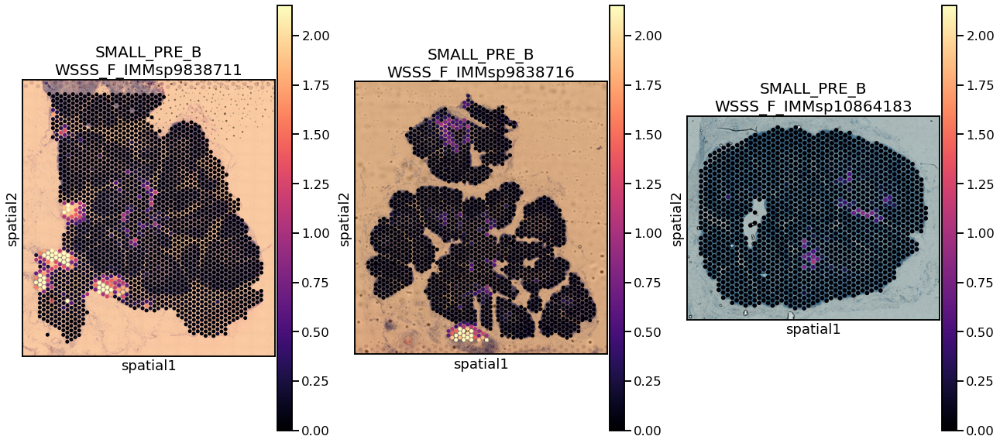

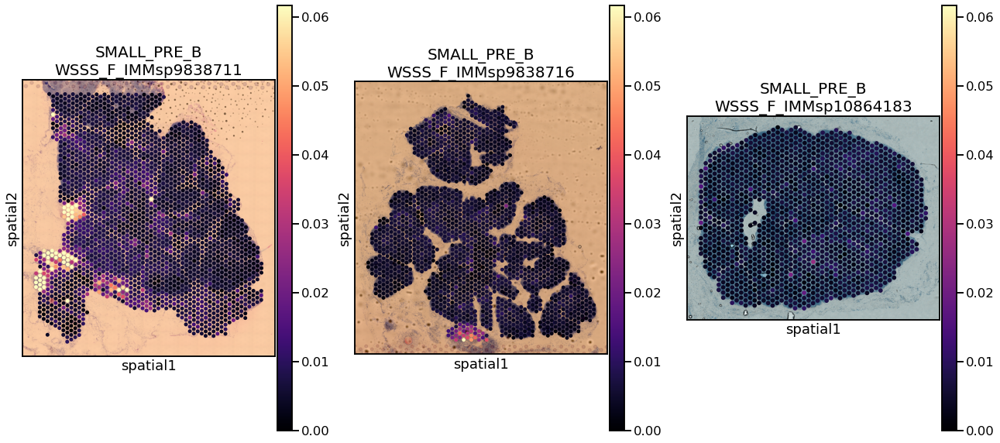

In [302]:
fig = plot_spatial_per_cell_type(c2l_results["TH"], cell_type="SMALL_PRE_B", samples=vis_sample_metadata.index[vis_sample_metadata.Organ=="TH"])
fig.savefig(figdir + "lowcorrelation_SMALL_PRE_B_TH_single.pdf")
fig = plot_spatial_per_cell_type(adata_vis_full, cell_type="SMALL_PRE_B", samples=vis_sample_metadata.index[vis_sample_metadata.Organ=="TH"])
fig.savefig(figdir + "lowcorrelation_SMALL_PRE_B_TH_multi.pdf")

... storing 'Organ' as categorical
... storing 'Organ' as categorical
... storing 'Organ' as categorical


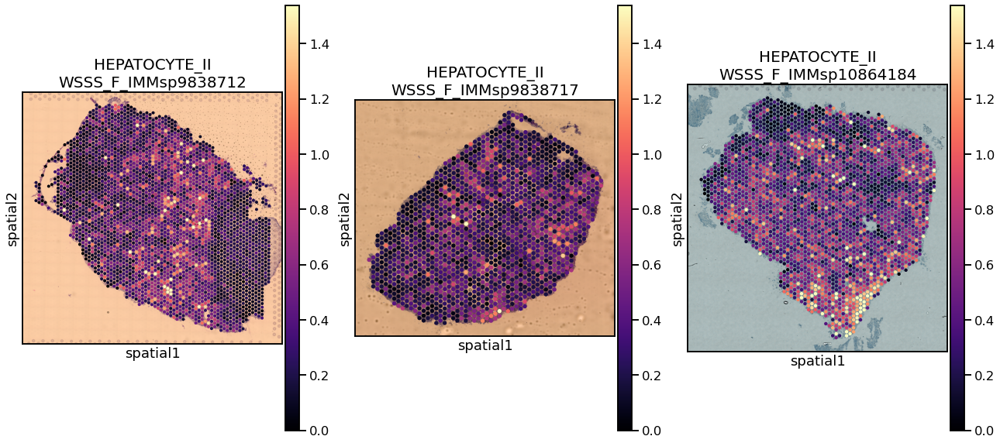

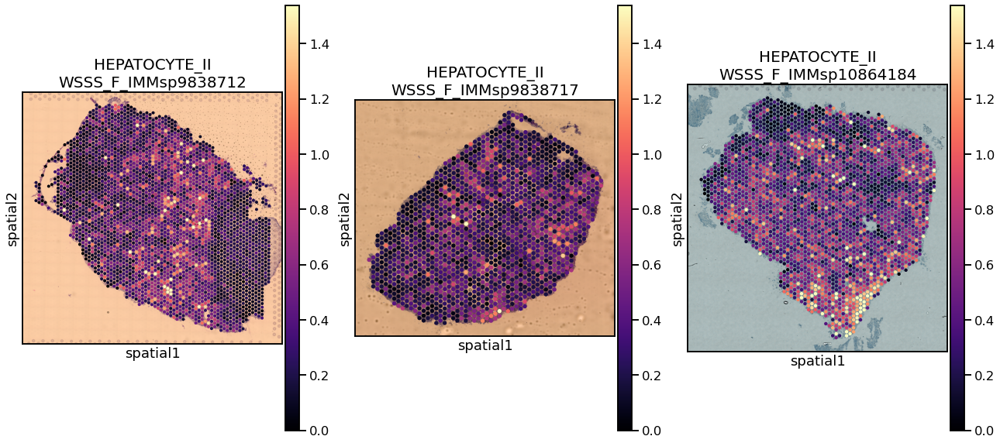

In [476]:
plot_spatial_per_cell_type(c2l_results["LI"], cell_type="HEPATOCYTE_II", samples=vis_sample_metadata.index[vis_sample_metadata.Organ=="LI"])

... storing 'Organ' as categorical
... storing 'Organ' as categorical
... storing 'Organ' as categorical


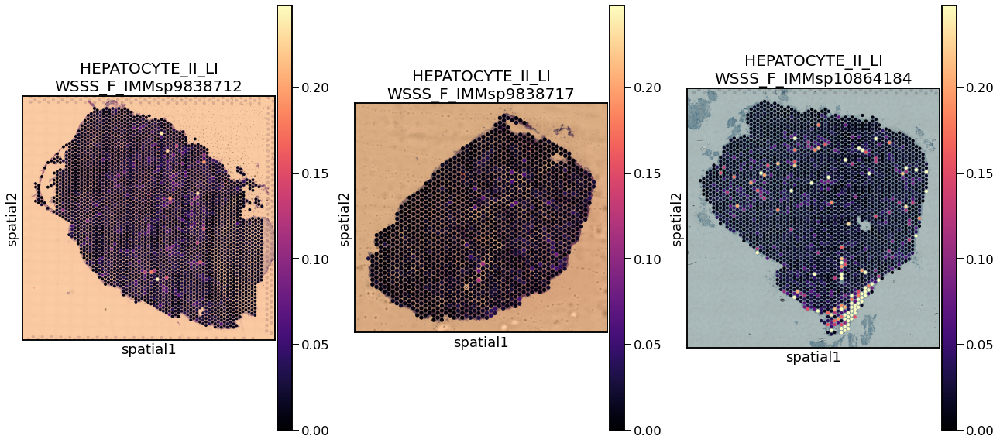

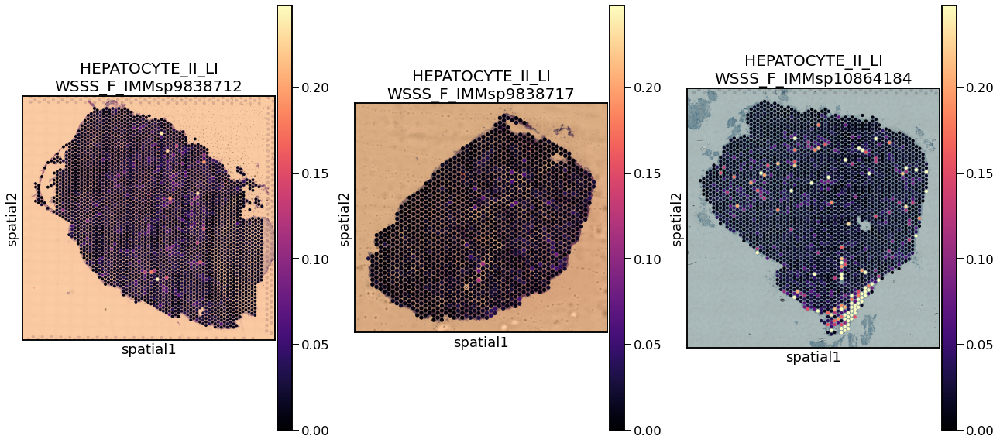

In [481]:
plot_spatial_per_cell_type(adata_vis_full, cell_type="HEPATOCYTE_II_LI", samples=vis_sample_metadata.index[vis_sample_metadata.Organ=="LI"])

... storing 'Organ' as categorical
... storing 'Organ' as categorical
... storing 'Organ' as categorical


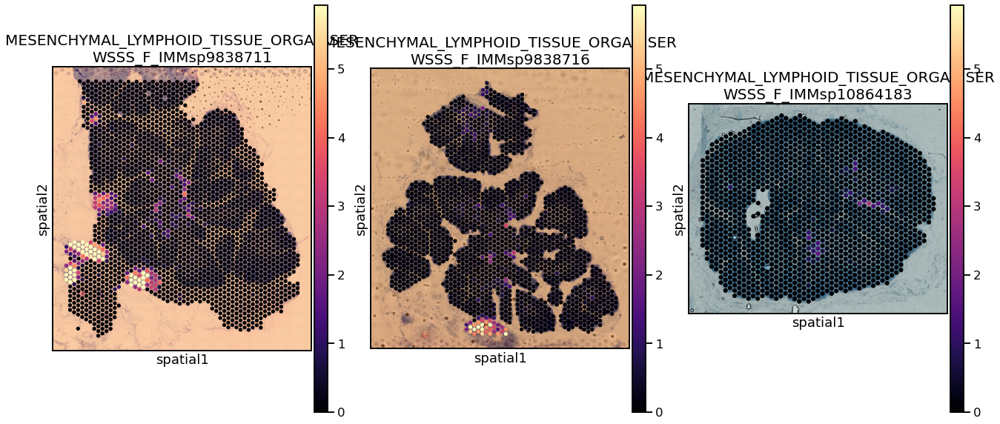

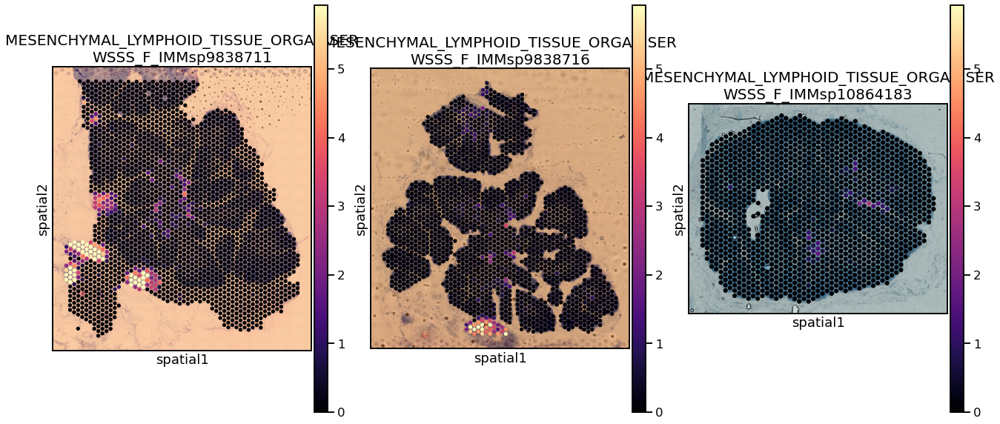

In [316]:
plot_spatial_per_cell_type(c2l_results["TH"], 
                           cell_type="MESENCHYMAL_LYMPHOID_TISSUE_ORGANISER", 
                           samples=vis_sample_metadata.index[vis_sample_metadata.Organ=="TH"])

... storing 'Organ' as categorical
... storing 'Organ' as categorical
... storing 'Organ' as categorical


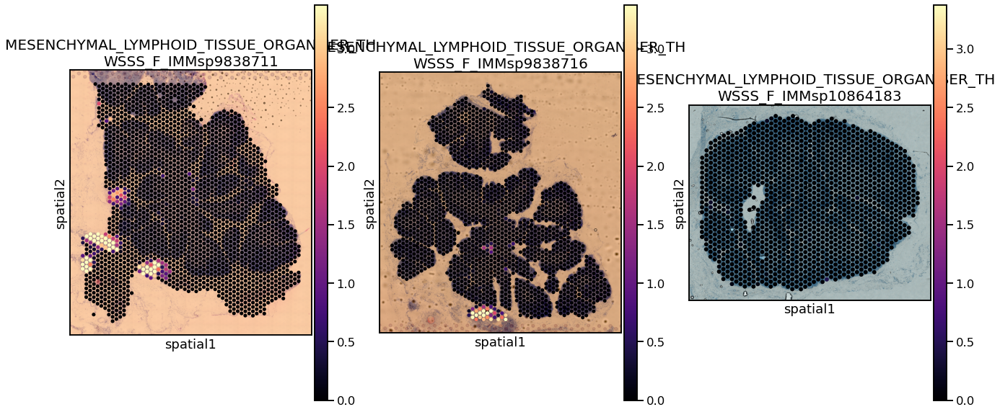

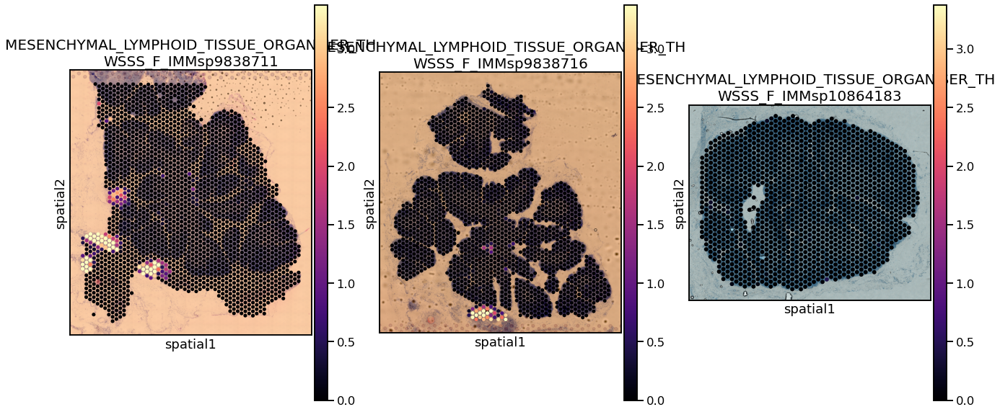

In [317]:
plot_spatial_per_cell_type(adata_vis_full, 
                           cell_type="MESENCHYMAL_LYMPHOID_TISSUE_ORGANISER_TH", 
                           samples=vis_sample_metadata.index[vis_sample_metadata.Organ=="TH"])

In [284]:
# %%R -i cts_corr
# library(ggrepel)
# library(patchwork)

# p2 <- cts_corr %>%
#     rownames_to_column() %>%
#     mutate(label=ifelse(multi_vs_single_organ_correlation < 0.5, rowname, NA)) %>%
#     ggplot(aes(organ_mean, multi_vs_single_organ_correlation)) +
#     geom_point() +
#     theme_bw(base_size=18) +
#     xlab("Mean abundance\n(single-organ reference)") +
#     geom_text_repel(data=. %>% filter(!is.na(label)),
#                     aes(label=label)
#                    ) +
#     remove_y_axis()
    
# p1 <- cts_corr %>%
#     rownames_to_column() %>%
#     mutate(label=ifelse(multi_vs_single_organ_correlation < 0.5, rowname, NA)) %>%
#     ggplot(aes(1, multi_vs_single_organ_correlation)) +
#     geom_boxplot() +
#     ylab("Multi VS single organ reference\nabundance correlation") +
#     theme_bw(base_size=18) +
#     remove_x_axis()
            
# (p1 | p2) + 
# plot_layout(widths=c(1,3))

---

## Junk

## Co-location analysis
By Natsuhiko / Kazumasa

In [25]:
# convert to proportion
def convert_to_prop(array):
    prop = array/np.sum(array)
    return prop

def colocation_enrichment(cell_abundance_df, 
#                           plot=False, 
#                           figdir
                         ):
    '''
    Params:
    ------
    - cell_abundance_df: pd.DataFrame of cell abundance in spots
    
    Outputs:
    --------
    - dataframe of dimensions celltypes x celltypes storing log10 enrichment score
    - dataframe of dimensions celltypes x celltypes storing enrichment q-values
    '''
    from rpy2.robjects import r, pandas2ri
    pandas2ri.activate()
    
    df = cell_abundance_df.apply(convert_to_prop, axis=1)
    r.assign("Z", pandas2ri.py2rpy_pandasdataframe(df))
    r("Z = as.matrix(Z)")
    r("colnames(Z)")

    outdir_call = "setwd('{f}')".format(f=figdir)

    # # heatmap
    # outdir_call = "setwd('{f}')".format(f=figdir)
    # r(outdir_call) # place you want to save heatmap
    # r("source('/nfs/team205/ed6/bin/scripts/spatial/getEnrichment/getEnrichment3_heatmap.R')")
    
    # values: enrichment score, q value
    r("result = source('/nfs/team205/ed6/bin/scripts/spatial/getEnrichment/getEnrichment3_velues.R')")
    result = r("result")[0]

    # log10 enrichment score
    enr_df = pd.DataFrame(
        result[2],
        index = result[0],
        columns = result[1]
    )

    # q value
    q_df = pd.DataFrame(
        result[3],
        index = result[0],
        columns = result[1]
    )
    return(enr_df, q_df)

In [26]:
org = "SP"
cell_abundance_df = adata_vis.obs.loc[adata_vis.obs.Organ == org,celltypes_df.index]
org_enr_df, org_q_df = colocation_enrichment(cell_abundance_df)

In [49]:
org_enr_df

,ABT(ENTRY),B1,BM_CD14_MONO,CD4+T,CD8+T,CD8AA,CD14+_MACROPHAGE,CD14_MONO,CD16+_MACROPHAGE,CHONDROCYTE_TH,...,VSMC_LI,VSMC_PERICYTE_LI,VSMC_PERICYTE_SP,VSMC_PERICYTE_TH,VSMC_SP,VSMC_TH,YS_ERY,YS_ERY_MACROPHAGE,YS_MACROPHAGE,pDC
ABT(ENTRY),0.221817,0.498187,-0.476984,0.868319,0.929293,0.173243,-0.508579,-0.577063,-0.140450,-0.745622,...,-0.998041,-0.311248,0.220037,-0.189197,-0.661467,-0.554064,-0.224979,-0.287063,-0.796600,-0.614617
B1,0.498187,1.031526,-0.271979,1.123950,1.178566,0.387666,-0.285814,-0.382734,0.131020,-0.585419,...,-0.820275,-0.031721,0.718158,0.083990,-0.532679,-0.117526,-0.008021,-0.355320,-0.785968,-0.373047
BM_CD14_MONO,-0.476984,-0.271979,-1.132805,-0.006155,0.015512,-0.779488,-0.759991,-0.844196,-0.393608,-1.086753,...,-1.264245,-0.576227,-0.292532,-0.490932,-0.918182,-0.821998,-0.438873,-0.528400,-1.084216,-0.984703
CD4+T,0.868319,1.123950,-0.006155,1.299974,1.545232,0.739646,-0.048649,-0.116533,0.367121,-0.336907,...,-0.622163,0.169253,0.809879,0.322721,-0.330738,-0.096571,0.235604,-0.181763,-0.563095,-0.147789
CD8+T,0.929293,1.178566,0.015512,1.545232,1.336759,0.791564,-0.031289,-0.095824,0.381778,-0.315019,...,-0.598760,0.190002,0.846397,0.346255,-0.313968,-0.056057,0.245010,-0.151267,-0.533585,-0.117373
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
VSMC_TH,-0.554064,-0.117526,-0.821998,-0.096571,-0.056057,-0.754912,-0.805499,-0.933813,-0.473750,-1.126672,...,-1.063309,-0.466721,0.197569,-0.445334,-0.842816,-0.164917,-0.477056,-0.420937,-1.036111,-1.004743
YS_ERY,-0.224979,-0.008021,-0.438873,0.235604,0.245010,-0.596041,-0.424174,-0.534371,-0.053639,-0.743949,...,-0.915862,-0.241908,0.001768,-0.189750,-0.504812,-0.477056,-0.121654,-0.211267,-0.776179,-0.663634
YS_ERY_MACROPHAGE,-0.287063,-0.355320,-0.528400,-0.181763,-0.151267,-0.775883,-0.532914,-0.644458,-0.294098,-0.791192,...,-0.817870,-0.338562,0.029953,-0.140177,-0.272884,-0.420937,-0.211267,0.045435,-0.117954,-0.786178
YS_MACROPHAGE,-0.796600,-0.785968,-1.084216,-0.563095,-0.533585,-1.229700,-1.073749,-1.198037,-0.807173,-1.357403,...,-1.418835,-0.889148,-0.557470,-0.672521,-0.928565,-1.036111,-0.776179,-0.117954,-1.360066,-1.315731


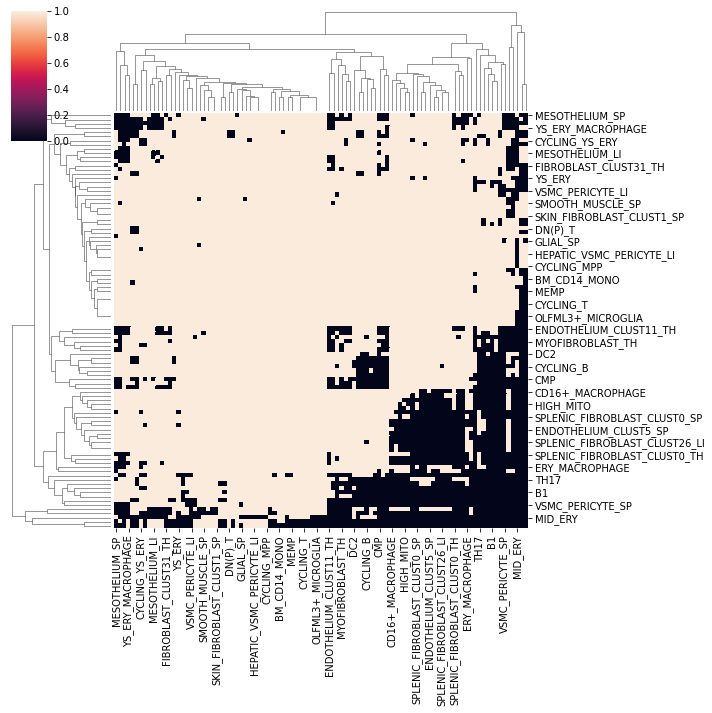

In [44]:
filt_org_q_df = org_q_df.copy() 
filt_org_q_df.where(org_q_df < 0.01, 1, inplace=True)
filt_org_q_df.where(org_q_df == 1, 0, inplace=True)
filt_org_q_df = filt_org_q_df.loc[filt_org_q_df.sum(1) != filt_org_q_df.shape[0],filt_org_q_df.sum(0) != filt_org_q_df.shape[0]]

sns.clustermap(
    filt_org_q_df
)

In [52]:
filt_org_enr_df = org_enr_df.copy() 
filt_org_enr_df.where(org_q_df < 0.01, 0, inplace=True)
# filt_org_enr_df = filt_org_enr_df.loc[celltypes_df.annotation[celltypes_df.anno_group == "STROMAL"].values, celltypes_df.annotation[celltypes_df.anno_group != "STROMAL"].values]
filt_org_enr_df = filt_org_enr_df.loc[filt_org_enr_df.sum(1) != 0, filt_org_enr_df.sum(0) != 0]


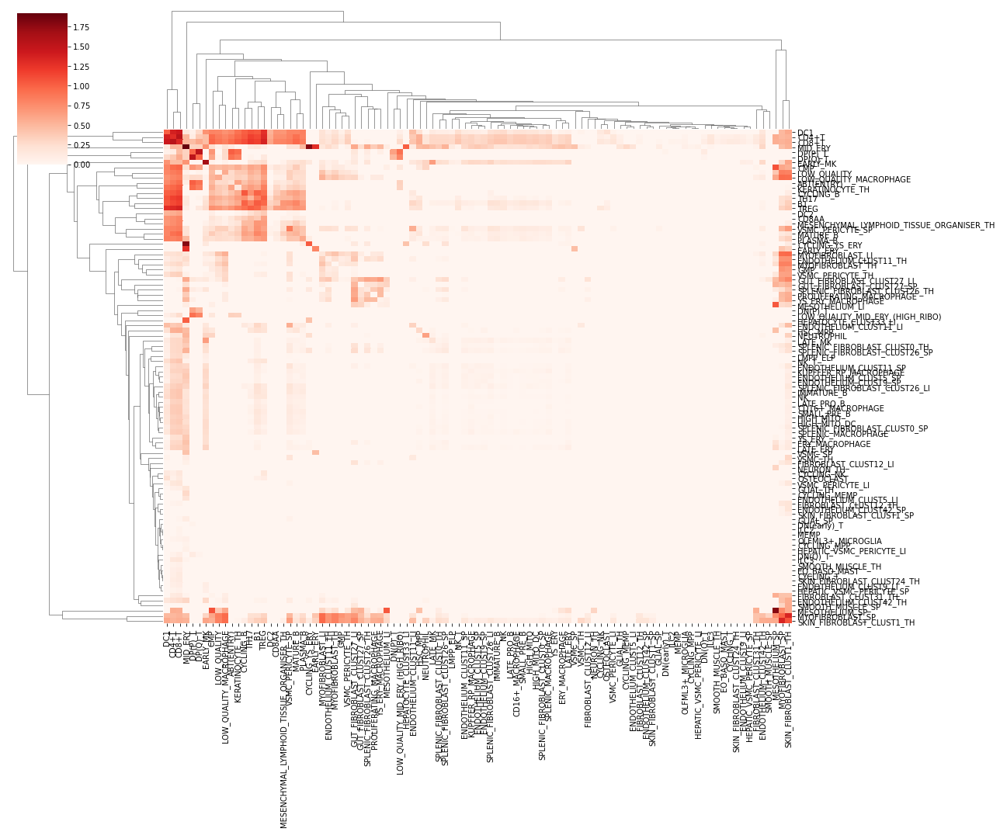

In [53]:
sns.clustermap(filt_org_enr_df, cmap='Reds', figsize=[18,15],
              yticklabels=True, xticklabels=True) 

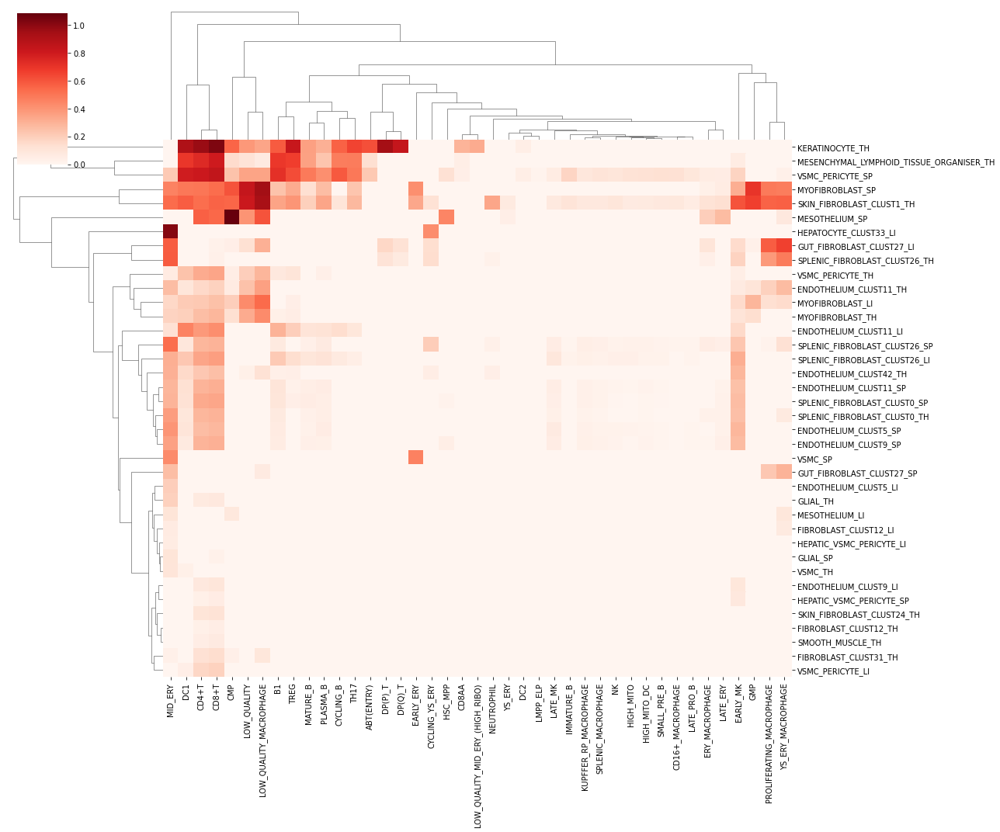

In [51]:
sns.clustermap(filt_org_enr_df, cmap='Reds', figsize=[18,15],
              yticklabels=True, xticklabels=True) 
plt.savefig(figdir + "{o}_stromal_immune_colocation.png".format(o=org))

In [21]:
adata_vis.var['gene_ids'] = adata_vis.var_names.copy()
adata_vis.var_names = adata_vis.var['SYMBOL'].copy()

/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/anndata/_core/anndata.py:891: UserWarning: 
AnnData expects .var.index to contain strings, but got values like:
    ['TSPAN6', 'TNMD', 'DPM1', 'SCYL3', 'C1orf112']

    Inferred to be: categorical

  names = self._prep_dim_index(names, "var")


In [28]:
vis_sample_metadata.index[vis_sample_metadata.Organ=="SP"]

CategoricalIndex(['WSSS_F_IMMsp9838709', 'WSSS_F_IMMsp9838710',
                  'WSSS_F_IMMsp9838714', 'WSSS_F_IMMsp9838715'],
                 categories=['WSSS_F_IMMsp9838709', 'WSSS_F_IMMsp9838710', 'WSSS_F_IMMsp9838711', 'WSSS_F_IMMsp9838712', 'WSSS_F_IMMsp9838714', 'WSSS_F_IMMsp9838715', 'WSSS_F_IMMsp9838716', 'WSSS_F_IMMsp9838717'], ordered=False, name='sample', dtype='category')

/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/anndata/_core/anndata.py:120: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
... storing 'Organ' as categorical


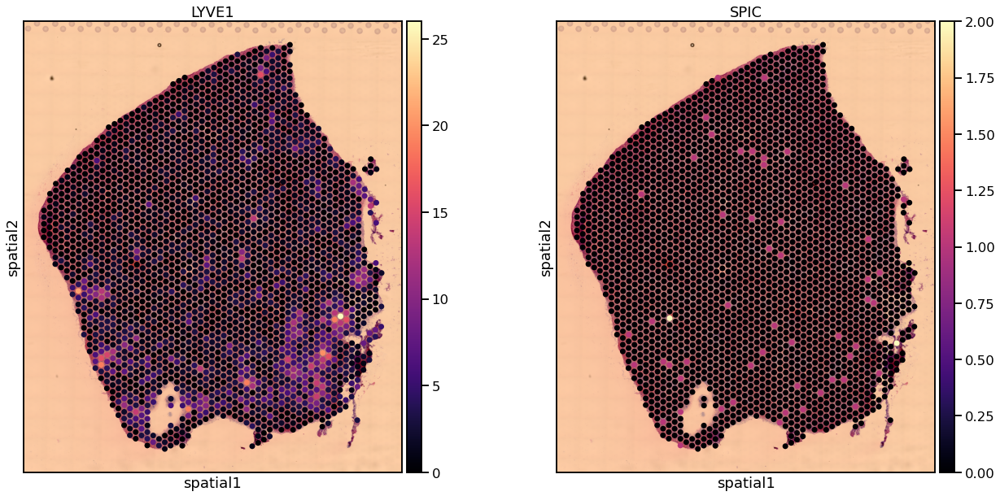

/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/anndata/_core/anndata.py:120: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
... storing 'Organ' as categorical


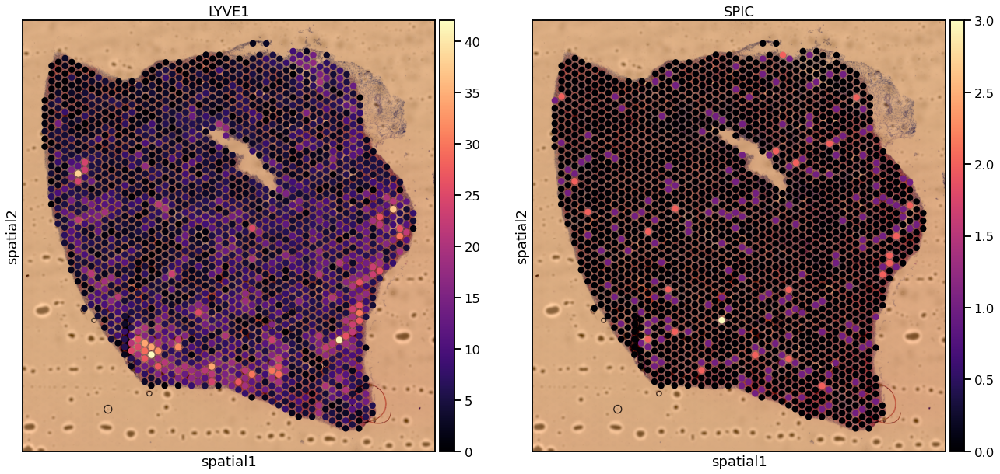

In [31]:
plt.rcParams["figure.figsize"] = [10,10]
sns.set_context("talk")
_spatial_plot_lib(adata_vis, lib=vis_sample_metadata.index[vis_sample_metadata.Organ=="SP"][1] , color=["LYVE1", "SPIC"], size=1.3, cmap='magma')
_spatial_plot_lib(adata_vis, lib=vis_sample_metadata.index[vis_sample_metadata.Organ=="SP"][3] , color=["LYVE1", "SPIC"], size=1.3, cmap='magma')

/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/anndata/_core/anndata.py:120: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
... storing 'Organ' as categorical


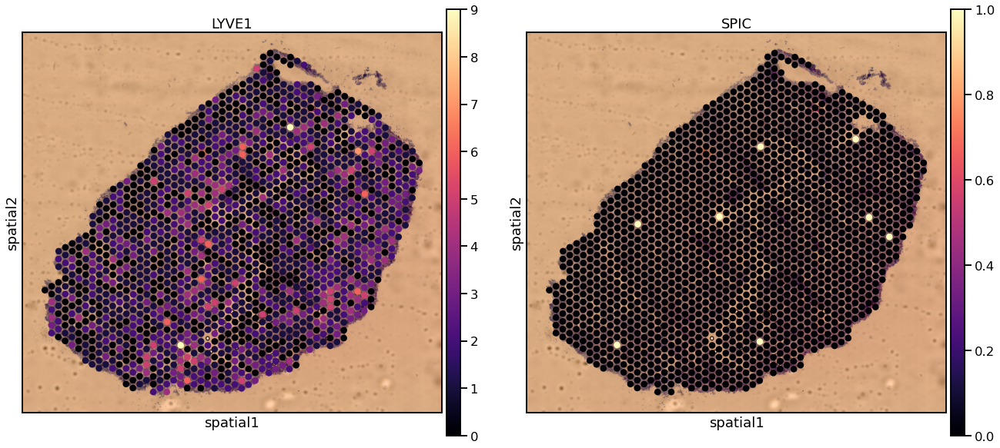

/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/anndata/_core/anndata.py:120: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
... storing 'Organ' as categorical


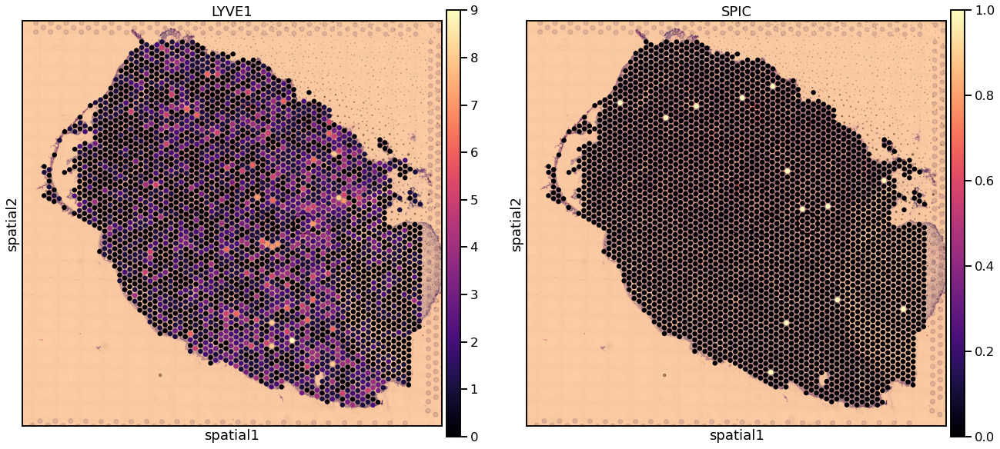

In [32]:
plt.rcParams["figure.figsize"] = [10,10]
_spatial_plot_lib(adata_vis, lib=vis_sample_metadata.index[vis_sample_metadata.Organ=="LI"][1] , color=["LYVE1", "SPIC"], size=1.3, cmap='magma')
_spatial_plot_lib(adata_vis, lib=vis_sample_metadata.index[vis_sample_metadata.Organ=="LI"][0] , color=["LYVE1", "SPIC"], size=1.3, cmap='magma')

/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/anndata/_core/anndata.py:120: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
... storing 'Organ' as categorical


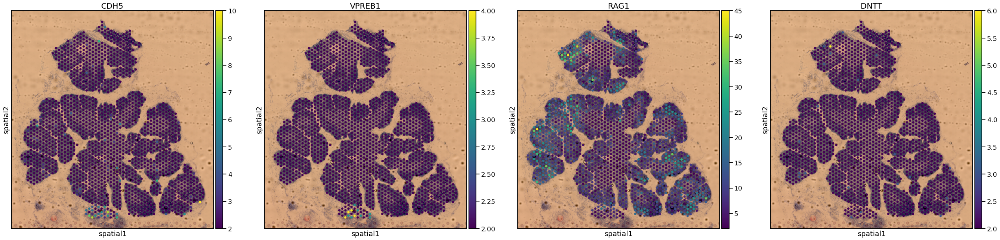

/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/anndata/_core/anndata.py:120: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
... storing 'Organ' as categorical


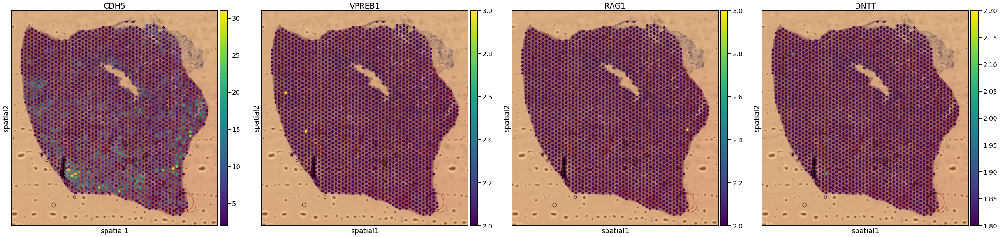

In [540]:
_spatial_plot_lib(adata_vis, color=["CDH5", "VPREB1", "RAG1", "DNTT"], lib = pl_params['TH']["lib"], vmin=2)
_spatial_plot_lib(adata_vis, color=["CDH5", "VPREB1", "RAG1", "DNTT"], lib = pl_params['SP']["lib"], vmin=2)

In [721]:
def scale_to_1(x):
    x_scaled = (x - min(x))/(max(x) - min(x))
    return(x_scaled)

def plot_colocation_scatter(adata_vis, x, y):
    adata_vis_pl = adata_vis.copy()
    adata_vis_pl.obs["Organ"] = adata_vis_pl.obs["Organ"].astype("str")
    adata_vis_pl.obs["Organ_R2"] = np.nan
    for o in adata_vis_pl.obs["Organ"].unique():
        r2 = np.corrcoef(adata_vis_pl.obs[adata_vis_pl.obs["Organ"] == o][[x,y]].T)[0,1]
        adata_vis_pl.obs.loc[adata_vis_pl.obs["Organ"] == o, "Organ_R2"] = o + " (R2 = {r})".format(r=np.round(r2, 3))
        adata_vis_pl.obs.loc[adata_vis_pl.obs["Organ"] == o, x]= scale_to_1(adata_vis_pl.obs.loc[adata_vis_pl.obs["Organ"] == o, x])
        adata_vis_pl.obs.loc[adata_vis_pl.obs["Organ"] == o, y]= scale_to_1(adata_vis_pl.obs.loc[adata_vis_pl.obs["Organ"] == o, y])
    sc.pl.scatter(adata_vis_pl, x, y, color="Organ_R2", legend_loc='upper right', title="Co-location");

In [722]:
def plot_colocation_heatmap(adata_vis, celltypes,
                            min_abundance = 0.1,
                            **kwargs):
    adata_vis_pl = adata_vis.copy()
    if min_abundance:
        ct_abundance = adata_vis_pl.obs[celltypes].copy()
        ct_abundance[adata_vis_pl.obs[celltypes] < min_abundance] = 0
        adata_vis_pl.obs[celltypes] = ct_abundance.copy()
    cormat = pd.DataFrame(np.corrcoef(adata_vis_pl.obs[celltypes].T),
                         columns=celltypes, index=celltypes)
    sns.clustermap(cormat, cmap='bwr', yticklabels=True, xticklabels=True, figsize=[15,15], 
                   vmax=1, vmin=-1,
                   **kwargs)

In [718]:
min_abundance = 0.1

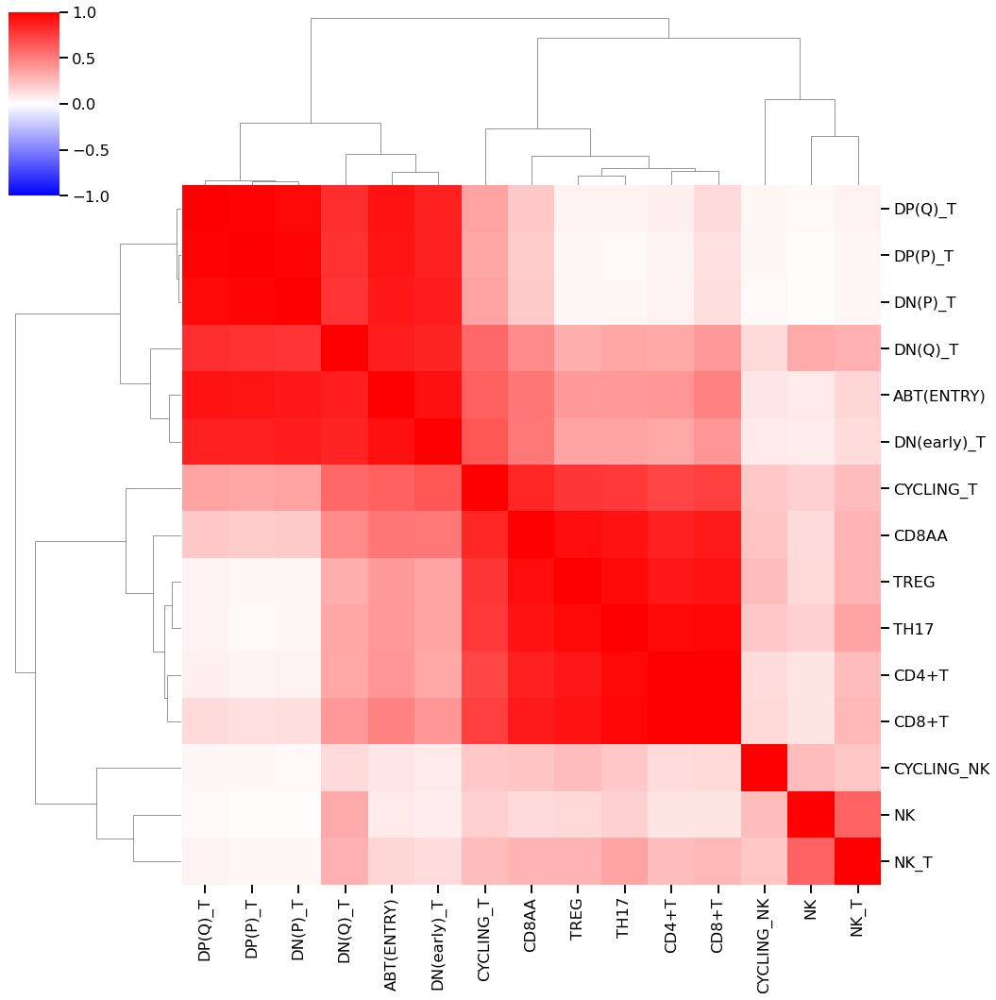

In [725]:
sns.set_context("talk")
plot_colocation_heatmap(adata_vis[adata_vis.obs.Organ == "SP"], anno_groups_dict["NK/T CELLS"],
                       min_abundance = 0.01)

... storing 'Organ' as categorical
... storing 'Organ_R2' as categorical


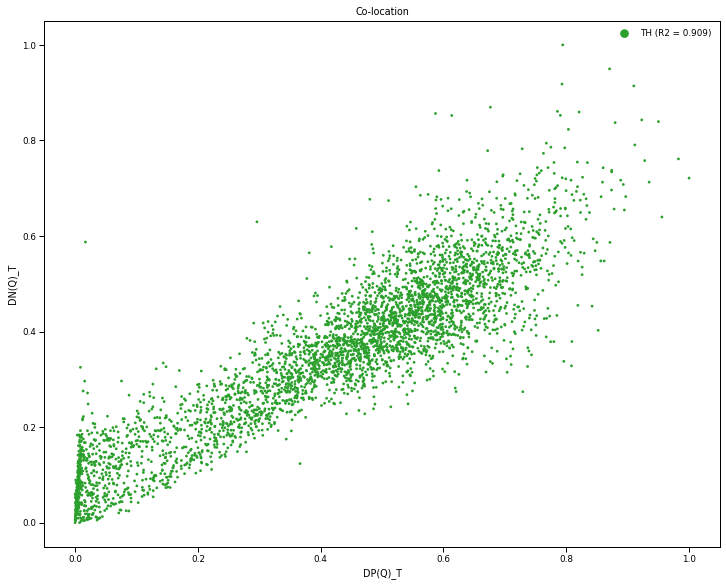

... storing 'Organ' as categorical
... storing 'Organ_R2' as categorical


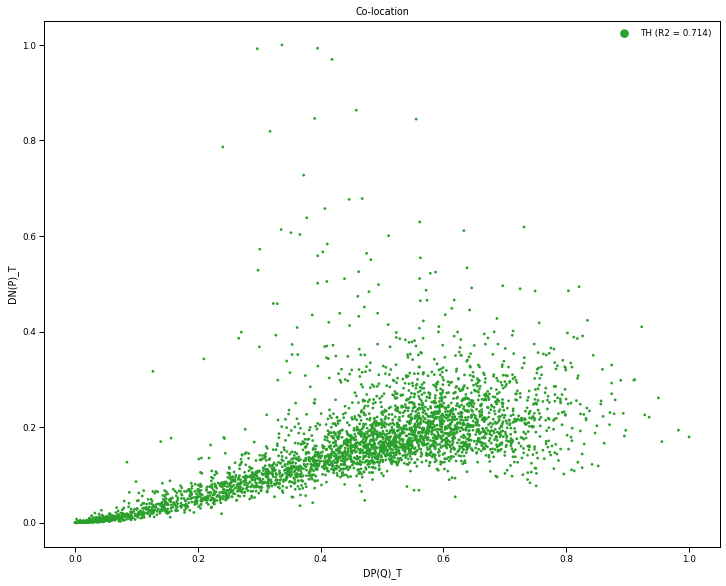

... storing 'Organ' as categorical
... storing 'Organ_R2' as categorical


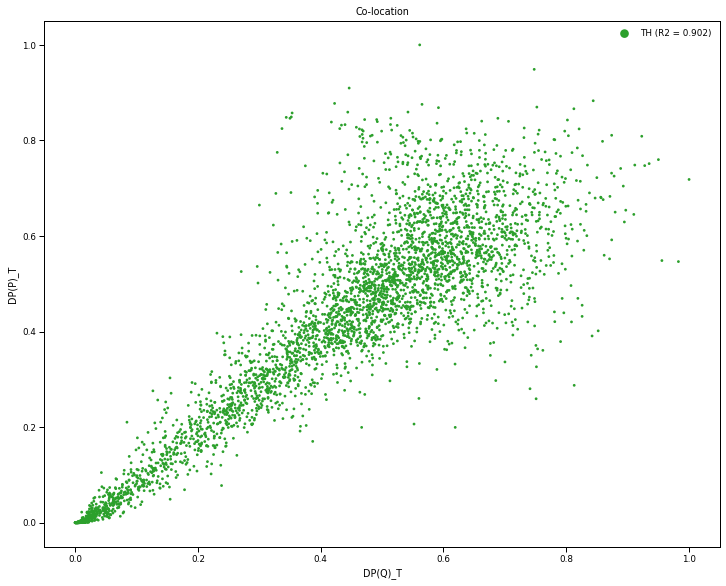

... storing 'Organ' as categorical
... storing 'Organ_R2' as categorical


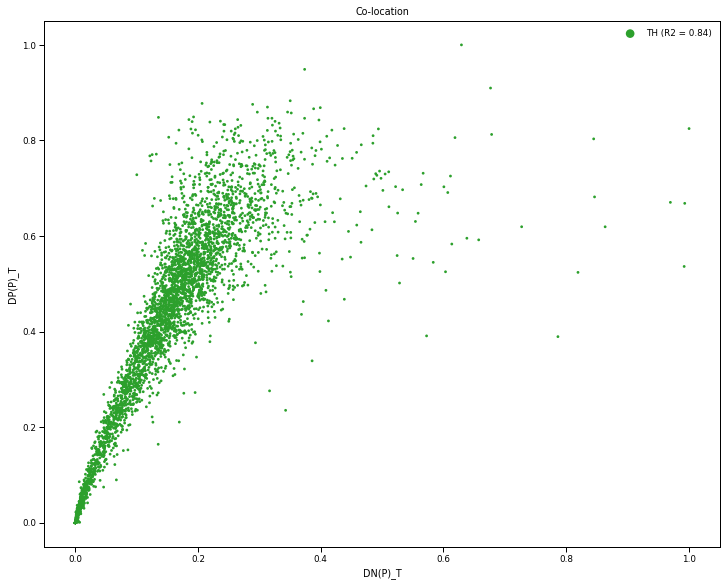

In [680]:
plot_colocation_scatter(adata_vis[adata_vis.obs.Organ == "TH"], "DP(Q)_T", "DN(Q)_T");
plot_colocation_scatter(adata_vis[adata_vis.obs.Organ == "TH"], "DP(Q)_T", "DN(P)_T");
plot_colocation_scatter(adata_vis[adata_vis.obs.Organ == "TH"], "DP(Q)_T", "DP(P)_T");
plot_colocation_scatter(adata_vis[adata_vis.obs.Organ == "TH"], "DN(P)_T", "DP(P)_T");